<a href="https://colab.research.google.com/github/merazAfridi/Blood-Cell-Segmentation/blob/main/retina_blood_vessel_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/retinablood/Data/test/mask/11.png
/kaggle/input/retinablood/Data/test/mask/4.png
/kaggle/input/retinablood/Data/test/mask/9.png
/kaggle/input/retinablood/Data/test/mask/14.png
/kaggle/input/retinablood/Data/test/mask/1.png
/kaggle/input/retinablood/Data/test/mask/2.png
/kaggle/input/retinablood/Data/test/mask/10.png
/kaggle/input/retinablood/Data/test/mask/18.png
/kaggle/input/retinablood/Data/test/mask/12.png
/kaggle/input/retinablood/Data/test/mask/7.png
/kaggle/input/retinablood/Data/test/mask/17.png
/kaggle/input/retinablood/Data/test/mask/5.png
/kaggle/input/retinablood/Data/test/mask/3.png
/kaggle/input/retinablood/Data/test/mask/16.png
/kaggle/input/retinablood/Data/test/mask/8.png
/kaggle/input/retinablood/Data/test/mask/6.png
/kaggle/input/retinablood/Data/test/mask/15.png
/kaggle/input/retinablood/Data/test/mask/13.png
/kaggle/input/retinablood/Data/test/mask/0.png
/kaggle/input/retinablood/Data/test/mask/19.png
/kaggle/input/retinablood/Data/test/image/11.png
/

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import os
import pandas as pd

In [ ]:
image_dir = "/kaggle/input/retinablood/Data/train/image/"
mask_dir = "/kaggle/input/retinablood/Data/train/mask/"

In [ ]:
images = [os.path.join(image_dir, file) for file in os.listdir(image_dir)]
masks = [os.path.join(mask_dir, file) for file in os.listdir(mask_dir)]

data = pd.DataFrame({"image": images, "mask": masks})

train_df, val_df = train_test_split(data, train_size=0.8, shuffle=True, random_state=12)

In [ ]:
image_datagen = ImageDataGenerator(rescale=1./255)
mask_datagen = ImageDataGenerator(rescale=1./255)

def create_generator(image_generator, mask_generator, batch_size=16):
    while True:
        for (img_batch, mask_batch) in zip(image_generator, mask_generator):
            yield img_batch, mask_batch

In [ ]:
train_image_generator = image_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="image",
    y_col=None,
    target_size=(128, 128),
    batch_size=16,
    class_mode=None,
    color_mode='rgb',
    shuffle=True,
    seed=42
)

train_mask_generator = mask_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="mask",
    y_col=None,
    target_size=(128, 128),
    batch_size=16,
    class_mode=None,
    color_mode='grayscale',
    shuffle=True,
    seed=42
)

train_generator = create_generator(train_image_generator, train_mask_generator)

val_image_generator = image_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="image",
    y_col=None,
    target_size=(128, 128),
    batch_size=16,
    class_mode=None,
    color_mode='rgb',
    shuffle=False,  # Validation data should not be shuffled
    seed=42
)

val_mask_generator = mask_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="mask",
    y_col=None,
    target_size=(128, 128),
    batch_size=16,
    class_mode=None,
    color_mode='grayscale',
    shuffle=False,  # Validation data should not be shuffled
    seed=42
)

val_generator = create_generator(val_image_generator, val_mask_generator)

Found 64 validated image filenames.
Found 64 validated image filenames.
Found 16 validated image filenames.
Found 16 validated image filenames.


# UNET

In [ ]:
def unet_model(input_size=(128, 128, 3)):
    inputs = Input(input_size)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)


    # Decoder
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [ ]:
model = unet_model(input_size=(128, 128, 3))
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 512) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 8, 8,      │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 8, 8,      │  9,438,208 │ conv2d_8[0][0]    │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 16, 16,    │  2,097,664 │ conv2d_9[0][0]    │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 16, 16,    │          0 │ conv2d_transpose

 Total params: 31,031,745 (118.38 MB)

 Trainable params: 31,031,745 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
batch_size = 8
history = model.fit(train_generator,validation_data=val_generator,
                    epochs=15,steps_per_epoch=len(train_df) // batch_size,
                    validation_steps=len(val_df) // batch_size)

Epoch 1/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 119s 14s/step - accuracy: 0.6317 - loss: 0.6807 - val_accuracy: 0.8824 - val_loss: 0.6278
Epoch 2/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 111s 14s/step - accuracy: 0.8738 - loss: 0.6025 - val_accuracy: 0.8824 - val_loss: 0.4285
Epoch 3/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 111s 14s/step - accuracy: 0.8742 - loss: 0.4405 - val_accuracy: 0.8824 - val_loss: 0.4094
Epoch 4/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 110s 14s/step - accuracy: 0.8745 - loss: 0.4165 - val_accuracy: 0.8824 - val_loss: 0.3789
Epoch 5/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 111s 14s/step - accuracy: 0.8747 - loss: 0.3788 - val_accuracy: 0.8824 - val_loss: 0.3083
Epoch 6/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 111s 14s/step - accuracy: 0.8760 - loss: 0.3094 - val_accuracy: 0.8824 - val_loss: 0.2823
Epoch 7/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 111s 14s/step - accuracy: 0.8753 - loss: 0.2880 - val_accuracy: 0.8824 - val_loss: 0.2706
Epoch 8/15
8/8 ━━━━━━━━━━━━━━━━━━━━ 110s 14s/step - accuracy: 0.8754 - loss: 0.2803 - val_accuracy: 0.8824 - val_loss:

In [ ]:
#the number of batches =32, to process during evaluation
val_loss, val_accuracy = model.evaluate(val_generator, steps=32)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')

32/32 ━━━━━━━━━━━━━━━━━━━━ 118s 4s/step - accuracy: 0.8824 - loss: 0.2537
Validation Loss: 0.25372788310050964
Validation Accuracy: 0.8824462890625


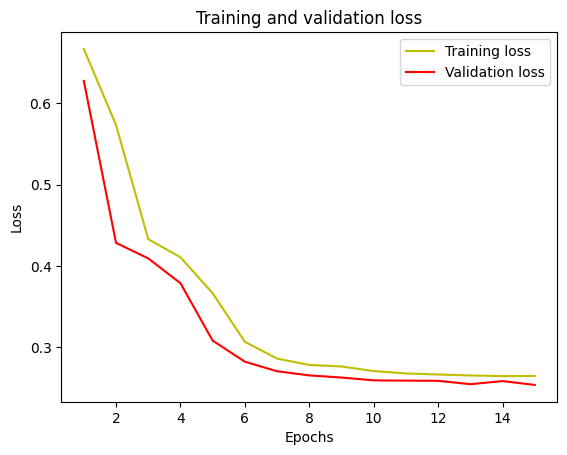

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# TEST

In [ ]:
# Define the paths to your test images and masks
test_image_dir = "/kaggle/input/retinablood/Data/test/image/"
test_mask_dir = "/kaggle/input/retinablood/Data/test/mask/"

test_images = [os.path.join(test_image_dir, file) for file in os.listdir(test_image_dir)]
test_masks = [os.path.join(test_mask_dir, file) for file in os.listdir(test_mask_dir)]

test_data = pd.DataFrame({"image": test_images, "mask": test_masks})


In [ ]:
test_image_generator = image_datagen.flow_from_dataframe(
    dataframe=test_data,
    x_col="image",
    y_col=None,
    target_size=(128, 128),
    batch_size=8,  # or any batch size you prefer
    class_mode=None,
    color_mode='rgb',
    shuffle=False,  # Test data should not be shuffled
    seed=42
)

test_mask_generator = mask_datagen.flow_from_dataframe(
    dataframe=test_data,
    x_col="mask",
    y_col=None,
    target_size=(128, 128),
    batch_size=8,  # or any batch size you prefer
    class_mode=None,
    color_mode='grayscale',
    shuffle=False,  # Test data should not be shuffled
    seed=42
)

test_generator = create_generator(test_image_generator, test_mask_generator)


Found 20 validated image filenames.
Found 20 validated image filenames.


In [ ]:
test_loss, test_accuracy = model.evaluate(test_generator, steps=len(test_data) // 8)  # Adjust steps as necessary
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.8751 - loss: 0.2614
Test Loss: 0.26073402166366577
Test Accuracy: 0.875152587890625


In [ ]:
model.save('unet_model.h5')  # Saves the model in HDF5 format

# Visualizaton

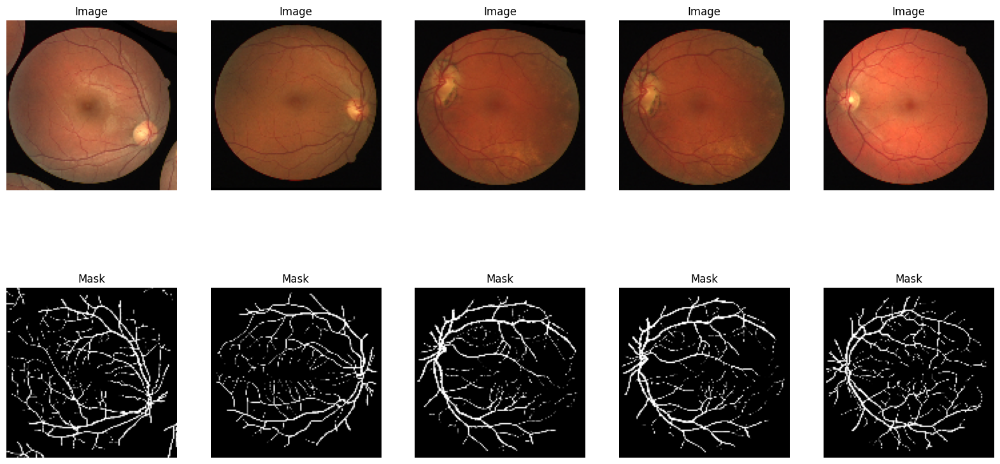

In [ ]:
import matplotlib.pyplot as plt

def visualize_data(images, masks, batch_size=5):
    plt.figure(figsize=(20, 10))  #figure for the plots
    for i in range(batch_size):
        #plot image in first row
        plt.subplot(2, batch_size, i + 1)
        plt.imshow(images[i])  # Display the i-th image
        plt.axis('off')  # Hide axis labels
        plt.title('Image')  # Title for the image

        #plotcorresponding mask
        plt.subplot(2, batch_size, i + 1 + batch_size)
        plt.imshow(masks[i].squeeze(), cmap='gray')  # Display mask
        plt.axis('off')  # Hide axis labels
        plt.title('Mask')
    plt.show()

# Get the next batch of images and masks from the training data
image_batch, mask_batch = next(train_generator)

# Visualize the batch of images and masks
visualize_data(image_batch, mask_batch)


**Comparison of the input images, their true segmentation masks, and the masks predicted by the model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


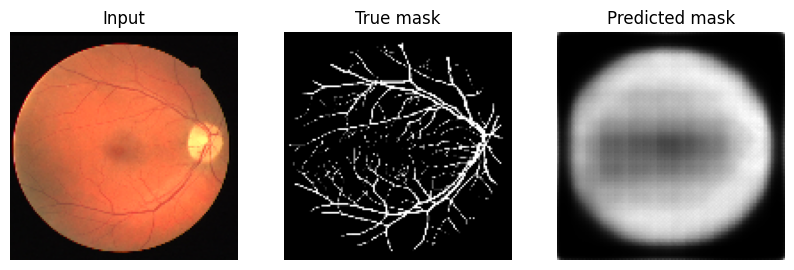

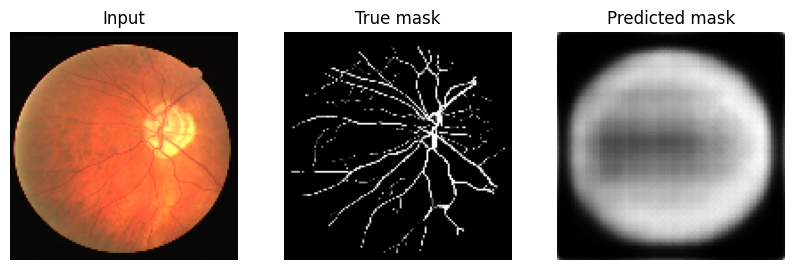

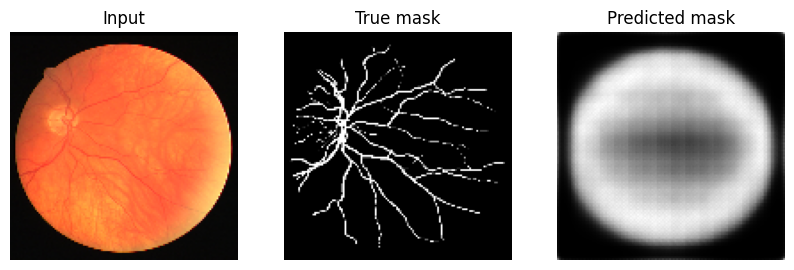

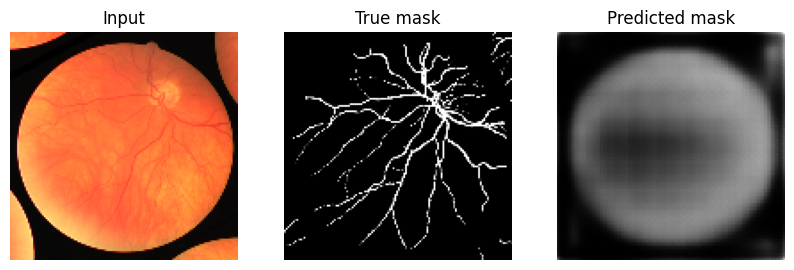

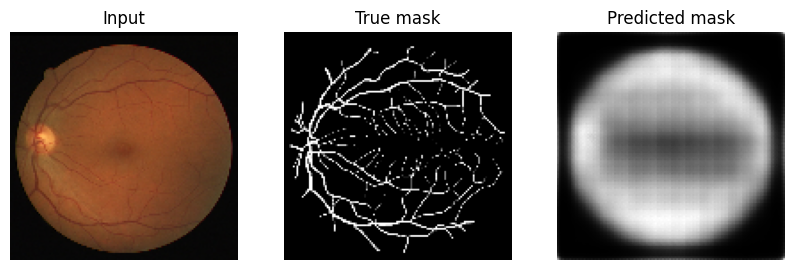

...

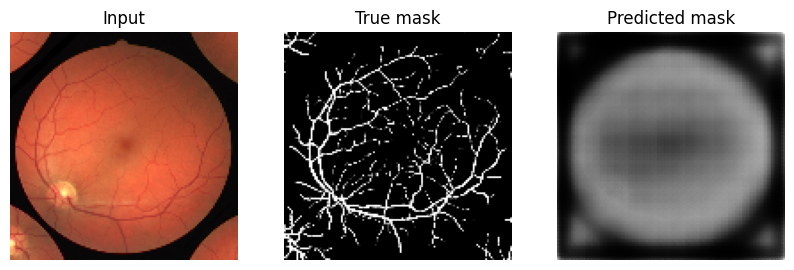

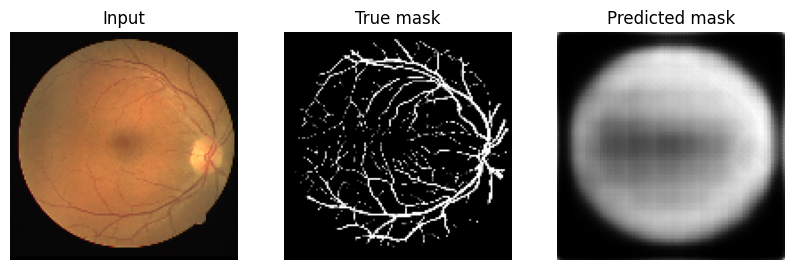

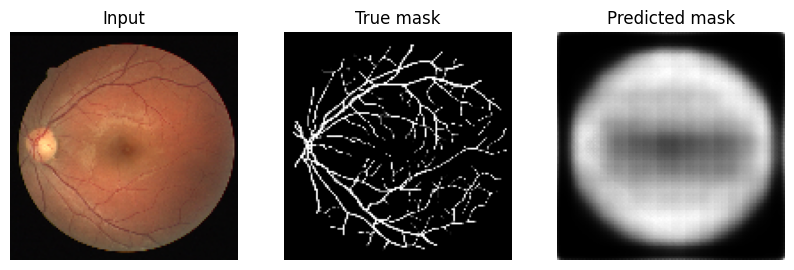

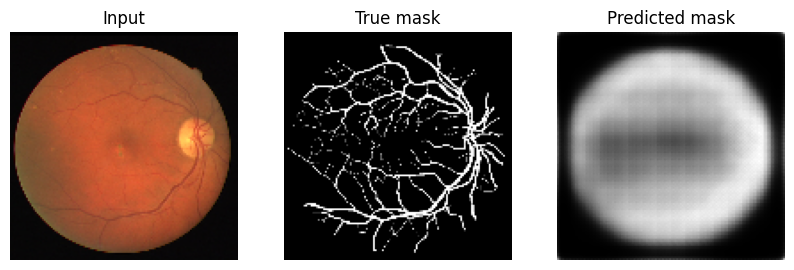

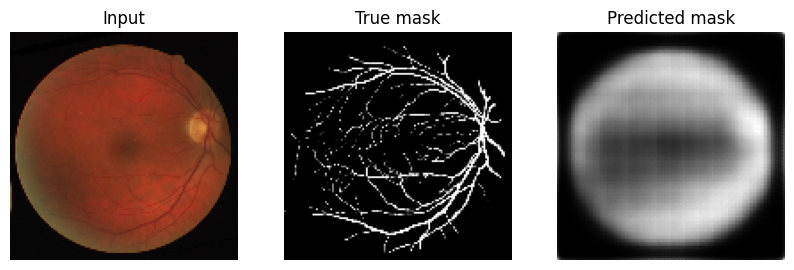

In [ ]:
def visualize_predictions(model, generator):
    #next batch of images and true masks
    images, true_masks = next(generator)

    #generate predictions
    predicted_masks = model.predict(images)

    #visualize results
    for i in range(len(images)):
        plt.figure(figsize=(10, 5))  # Create a new figure for each image

        #display input image
        plt.subplot(1, 3, 1)
        plt.title("Input")
        plt.imshow(images[i])
        plt.axis('off')

        #display corresponding true mask
        plt.subplot(1, 3, 2)
        plt.title("True mask")
        plt.imshow(true_masks[i].squeeze(), cmap='gray')
        plt.axis('off')

        #display predicted mask
        plt.subplot(1, 3, 3)
        plt.title("Predicted mask")
        plt.imshow(predicted_masks[i].squeeze(), cmap='gray')
        plt.axis('off')

        plt.show()

#visualize predictions
visualize_predictions(model, val_generator)


**Predicts and overlays masks on input images with adjustable transparency for visual comparison**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


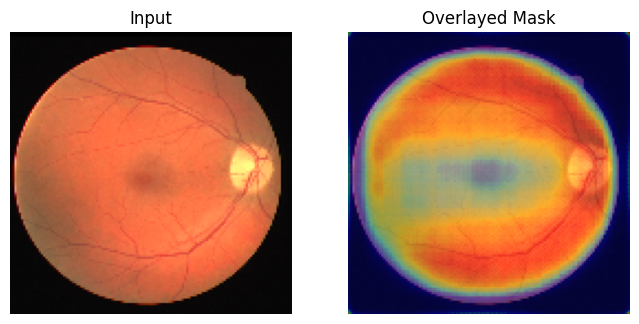

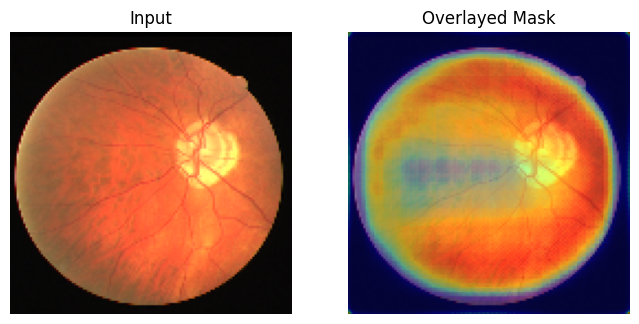

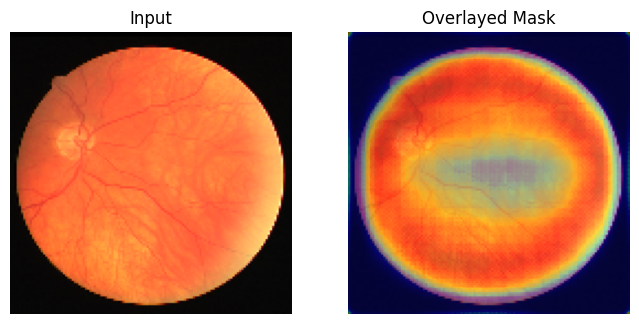

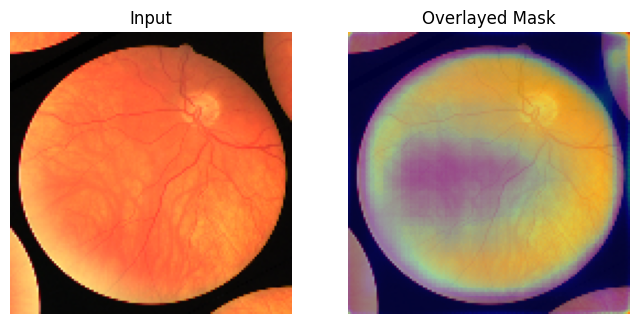

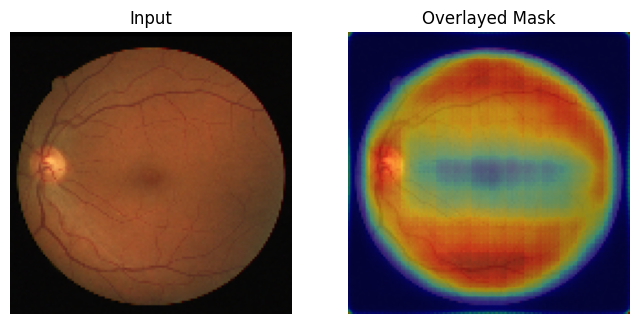

...

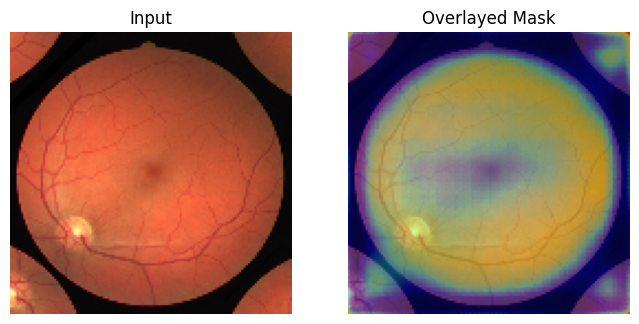

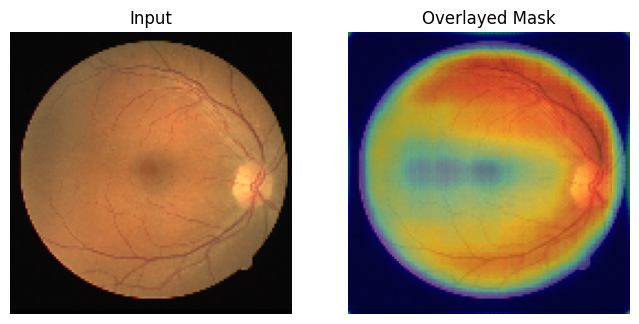

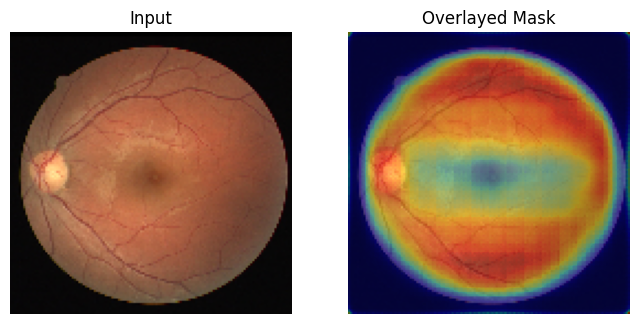

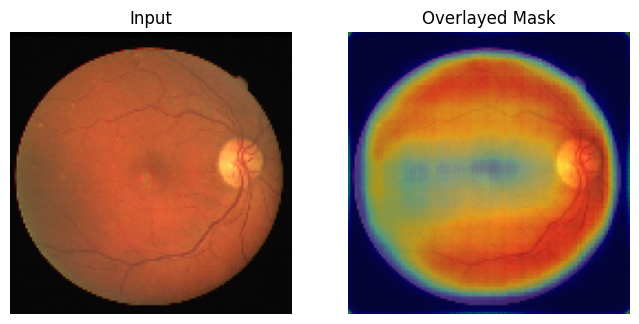

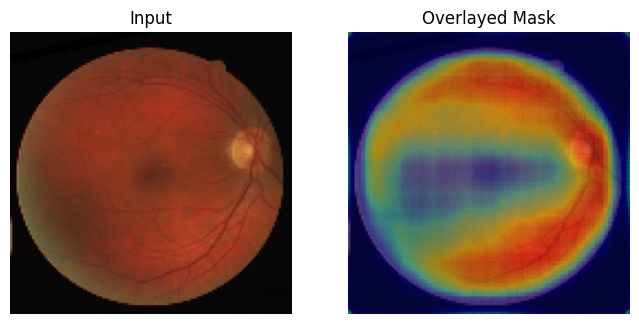

In [ ]:
def overlay_predictions(model, generator, alpha=0.4):
    #retrieve next batch of img, masks
    images, true_masks = next(generator)

    #generate predictions
    predicted_masks = model.predict(images)


    for i in range(len(images)):
        plt.figure(figsize=(8, 4))

        #display input img
        plt.subplot(1, 2, 1)
        plt.title("Input")
        plt.imshow(images[i])
        plt.axis('off')

        #display input with predicted mask overlaid on top
        plt.subplot(1, 2, 2)
        plt.title("Overlayed Mask")
        plt.imshow(images[i])
        plt.imshow(predicted_masks[i].squeeze(), cmap='jet', alpha=alpha)
        plt.axis('off')

        plt.show()

#visualize overlaid predictions
overlay_predictions(model, val_generator)


**Overlays predicted mask contours on images to assess alignment with object boundaries**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


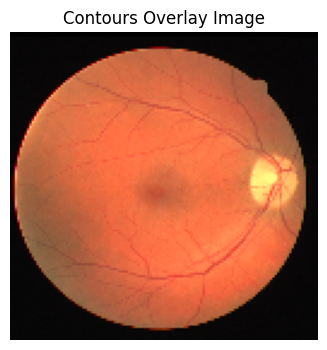

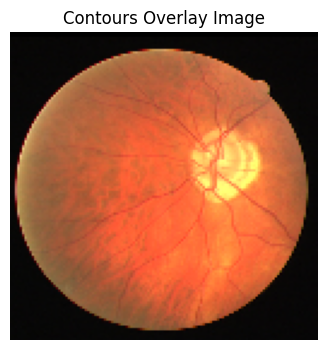

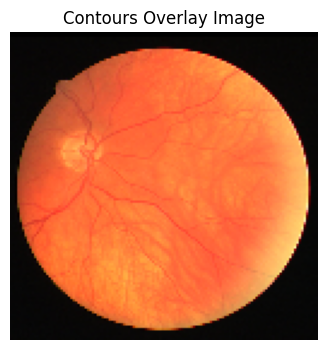

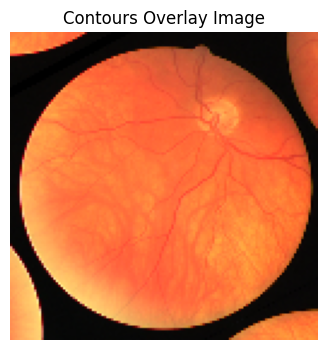

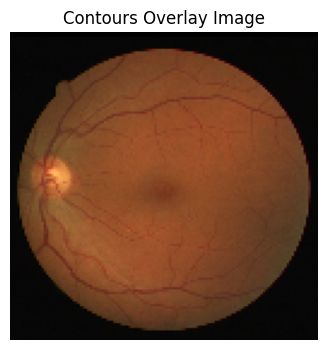

...

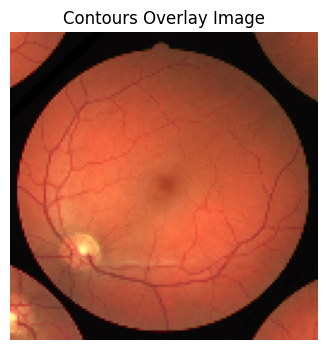

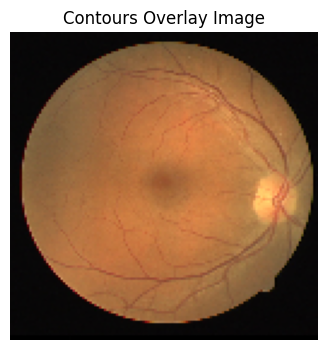

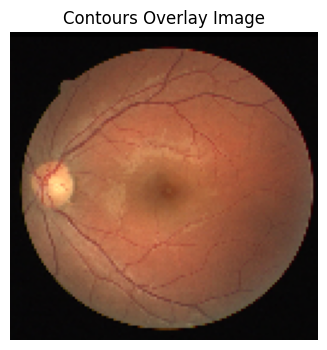

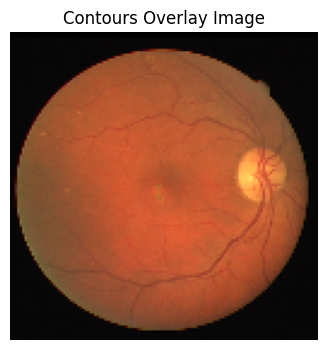

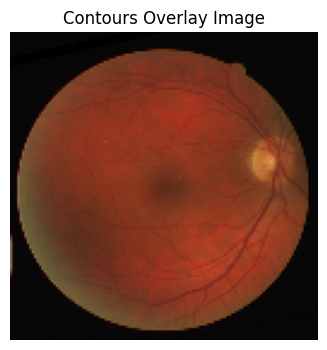

In [ ]:
import cv2
def contour_overlay_predictions(model, generator):
    # images and their true masks
    images, masks = next(generator)
    # Predict masks
    pred = model.predict(images)
    for i in range(len(images)):
        plt.figure(figsize=(8, 4))


        #convert predicted mask to binary (threshold at 0.5)
        bin_pred = pred[i].squeeze() > 0.5

        #find contours in binary mask using OpenCV
        contours, _ = cv2.findContours(bin_pred.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Create a copy of the image to draw contours on
        img_with_contours = images[i].copy()

        # Draw the contours on the image (blue lines)
        cv2.drawContours(img_with_contours, contours, -1, (255, 0, 0), 2)

        # Display the image with the overlay of contours
        plt.title("Contours Overlay Image")
        plt.imshow(img_with_contours)
        plt.axis('off')
        plt.show()

#visualize the contours overlay
contour_overlay_predictions(model, val_generator)


**Computes and visualizes the difference between true and predicted masks using a heatmap.**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


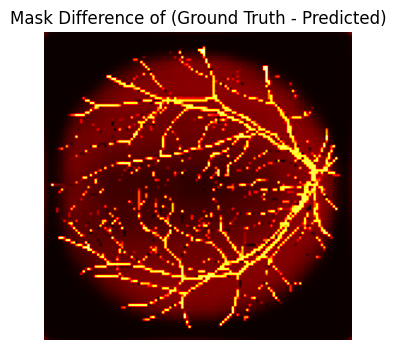

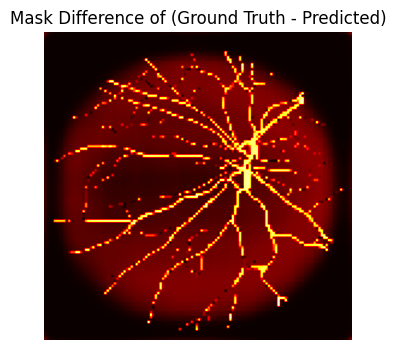

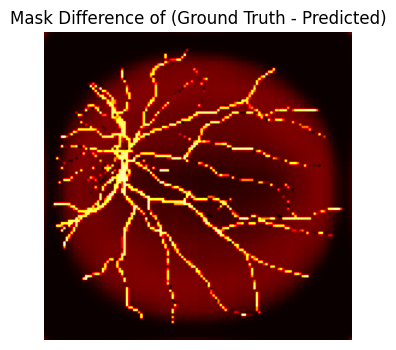

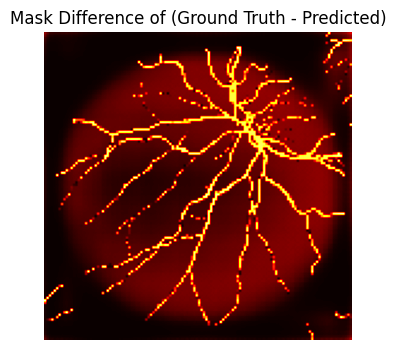

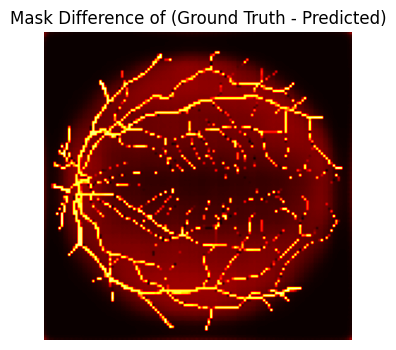

...

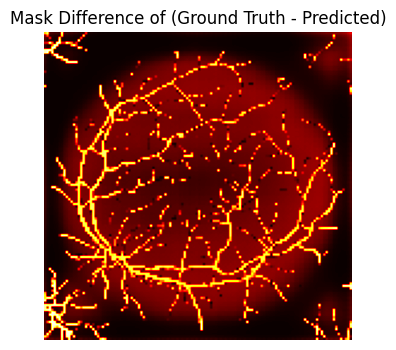

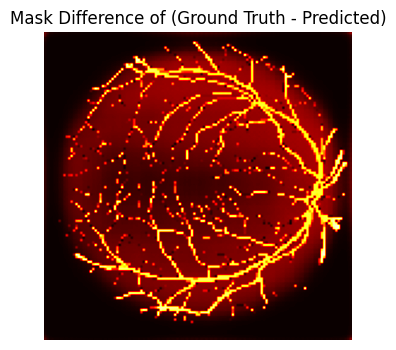

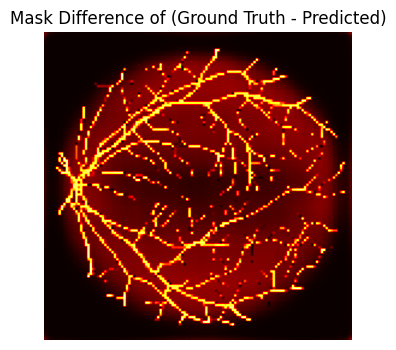

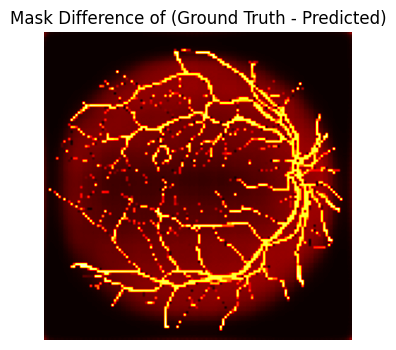

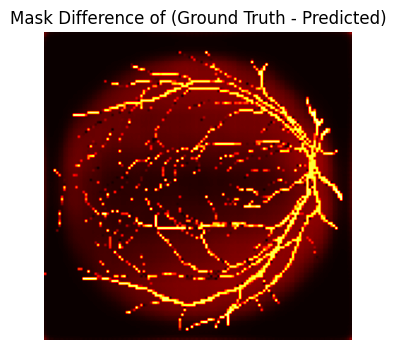

In [ ]:
def visualize_mask_differences(model, generator):
    #input images and their corresponding true masks
    input_images, ground_truth_masks = next(generator)

    #predict the masks
    pred_masks = model.predict(input_images)
    #loop through each image in the batch
    for i in range(len(input_images)):
        plt.figure(figsize=(8, 4))

        #calculate the absolute diff between ground truth and predicted masks
        mask_difference = np.abs(ground_truth_masks[i].squeeze() - pred_masks[i].squeeze())
        #display difference
        plt.title("Mask Difference of (Ground Truth - Predicted)")
        plt.imshow(mask_difference, cmap='hot')  # 'hot' colormap highlights discrepancies
        plt.axis('off')
        plt.show()
visualize_mask_differences(model, val_generator)


**Visualizes predicted masks as heatmaps next to original images for performance assessment.**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


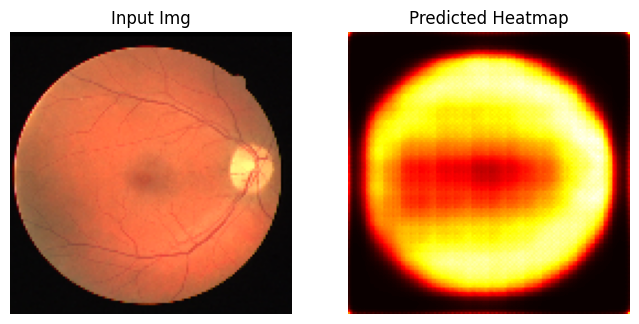

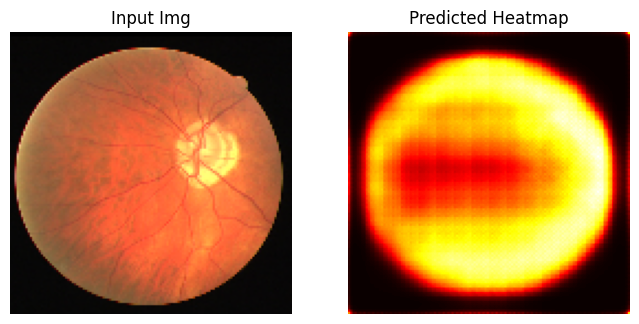

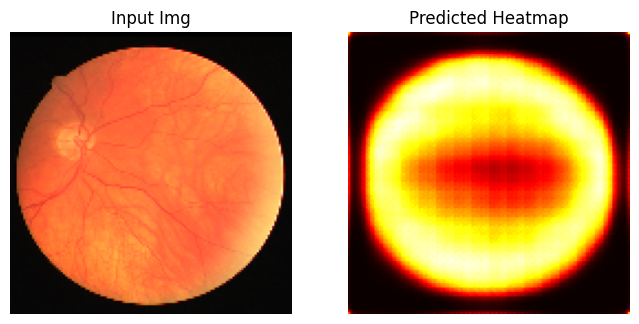

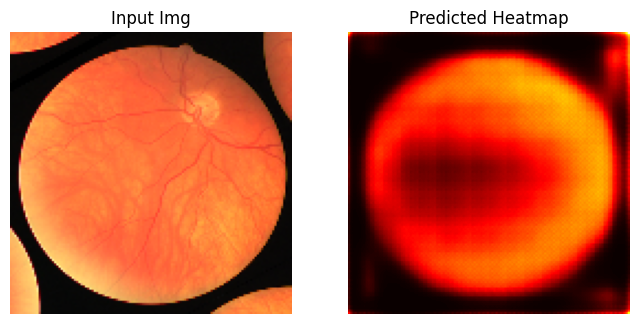

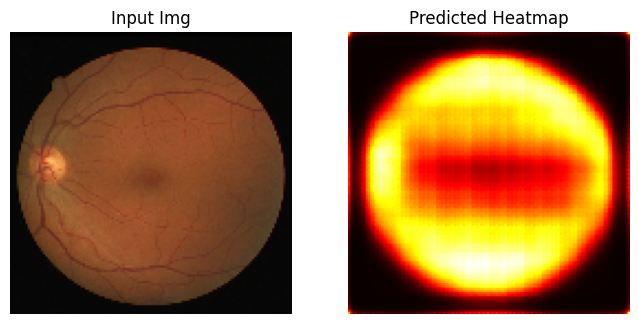

...

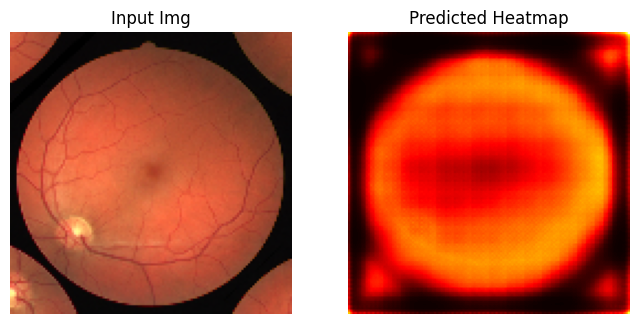

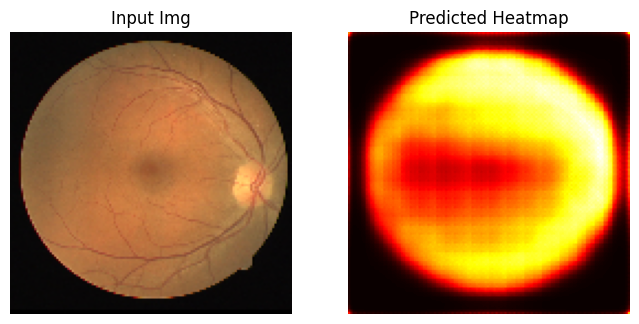

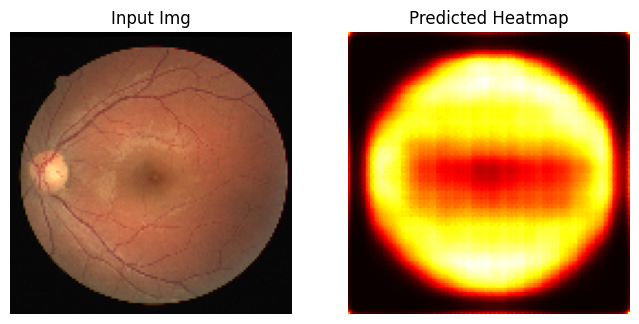

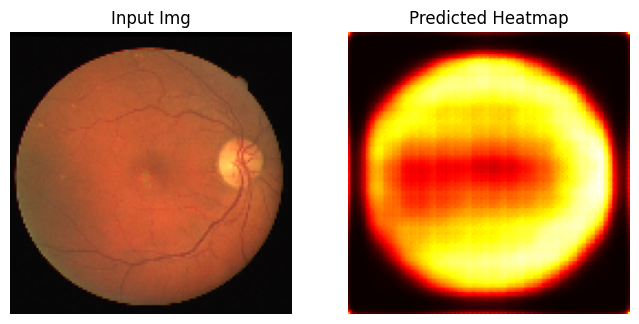

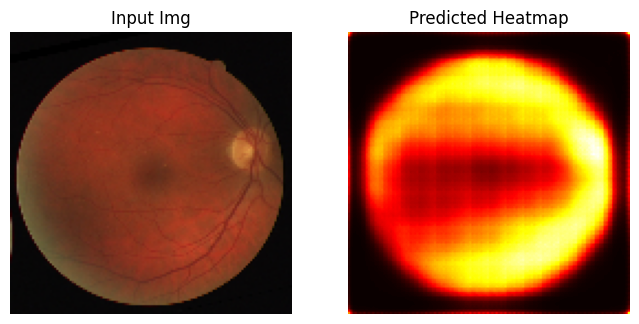

In [ ]:
def display_heatmap_predictions(model, generator):
    # input images and their true masks
    input_images, ground_truth_masks = next(generator)
    # Generate predictions
    predicted_masks = model.predict(input_images)



    for i in range(len(input_images)):
        plt.figure(figsize=(8, 4))
        # display input img
        plt.subplot(1, 2, 1)
        plt.title("Input Img")
        plt.imshow(input_images[i])
        plt.axis('off')

        #Display  predicted mask heatmam
        plt.subplot(1, 2, 2)
        plt.title("Predicted Heatmap")
        plt.imshow(predicted_masks[i].squeeze(), cmap='hot')
        plt.axis('off')
        plt.show()

#visualize heatmaps for predictions
display_heatmap_predictions(model, val_generator)


**Computes and visualizes the IoU metric for predicted masks versus true masks.**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


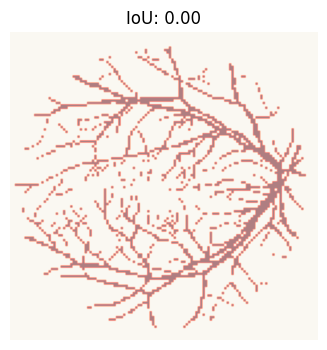

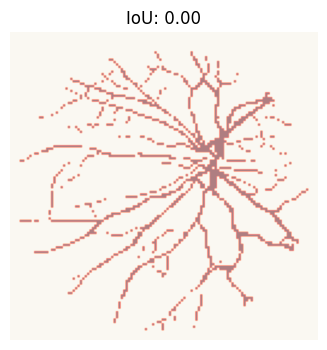

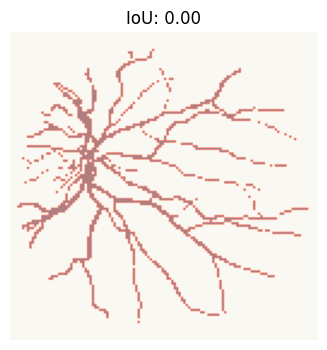

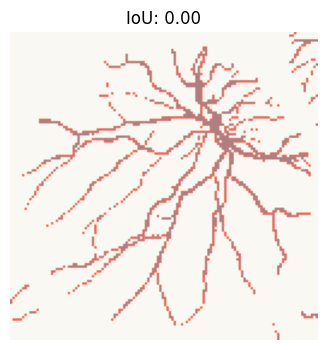

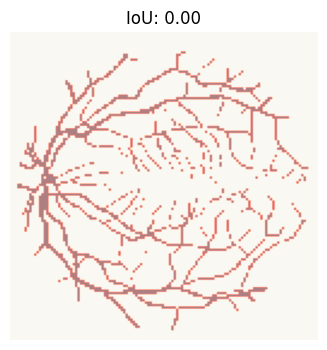

...

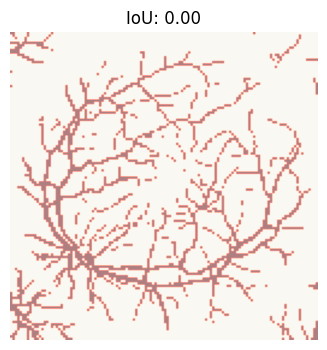

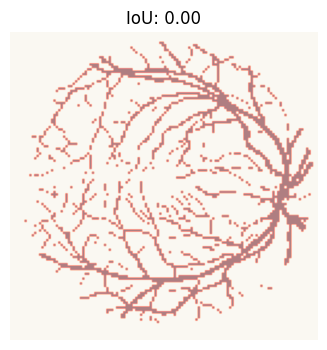

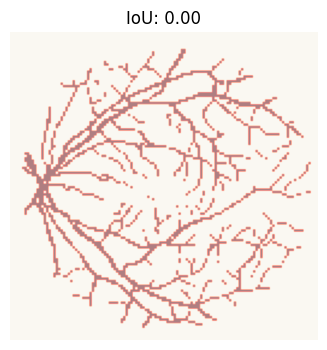

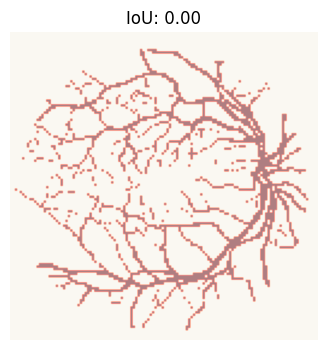

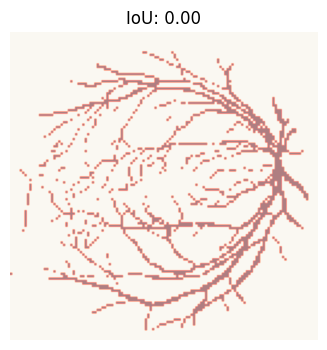

In [ ]:
def visualize_iou(model, generator):
    #input images and their corresponding true masks
    input_images, ground_truth_masks = next(generator)
    # Predict masks
    pred_masks = model.predict(input_images)
    #Loop
    for i in range(len(input_images)):
        plt.figure(figsize=(8, 4))


        #calculate the intersection and union for IoU
        intersection = np.logical_and(ground_truth_masks[i].squeeze(), pred_masks[i].squeeze() > 0.5)
        union = np.logical_or(ground_truth_masks[i].squeeze(), pred_masks[i].squeeze() > 0.5)

         #compute IoU
        iou_score = np.sum(intersection) / np.sum(union)

        #display the IoU score
        plt.title(f"IoU: {iou_score:.2f}")

        #visualize the intersection and union
        plt.imshow(intersection, cmap='Greens')  #show intersection in green

        # show union in red with transparency
        plt.imshow(union, cmap='Reds', alpha=0.5)
        plt.axis('off')
        plt.show()

#visualize IoU for predictions
visualize_iou(model, val_generator)
